In [1]:
import supereeg as se
import pandas as pd
import numpy as np
import os
import hypertools as hyp
import plot as plot
import scipy.spatial as spatial
import matplotlib
import matplotlib.cm as cm
import matplotlib.pyplot as plt
from scipy import stats
import seaborn as sns
from nilearn import plotting as ni_plt

In [2]:
fig_dir = '../../paper/figs/source/methods'

In [3]:
ram_data_dir = '../../data/ram'
pyfr_data_dir = '../../data/pyfr'

In [4]:
fig_count = 0

# Method Figures

## load data locally

In [5]:
ave_pyfr_model = se.load('/Users/lucyowen/Desktop/paper_figures/pyfr/ave_mat.mo')
ave_ram_model = se.load('/Users/lucyowen/Desktop/paper_figures/ram/ave_mat.mo')
model_1 = se.load('/Users/lucyowen/Desktop/paper_figures/pyfr/1.mo')
model_2 = se.load('/Users/lucyowen/Desktop/paper_figures/pyfr/2.mo')
model_3 = se.load('/Users/lucyowen/Desktop/paper_figures/pyfr/3.mo')
model_4 = se.load('/Users/lucyowen/Desktop/paper_figures/pyfr/4.mo')
bo = se.load('/Users/lucyowen/Desktop/paper_figures/pyfr/4_sub.bo')
mo = se.load('/Users/lucyowen/Desktop/paper_figures/pyfr/4.mo')

/usr/local/lib/python3.6/site-packages/supereeg/helpers.py:909: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  X = X.as_matrix()


In [6]:
electrode = 46
lower_bound=5
upper_bound=10
e = bo.get_locs().iloc[electrode]

In [7]:
ave_pyfr_mat = ave_pyfr_model.get_model(z_transform=False) 

In [8]:
ave_ram_mat = ave_ram_model.get_model(z_transform=False) 

In [9]:
# cluster_pyfr_labels = hyp.cluster(ave_pyfr_mat, n_clusters=7)
# np.save(os.path.join(pyfr_data_dir, 'cluster_pyfr_labels.npy'), cluster_pyfr_labels)

In [10]:
cluster_pyfr_labels = np.load(os.path.join(pyfr_data_dir, 'cluster_pyfr_labels.npy'))

In [11]:
# cluster_ram_labels = hyp.cluster(ave_ram_mat, n_clusters=7)
# np.save(os.path.join(ram_data_dir, 'cluster_ram_labels.npy'), cluster_ram_labels)

In [12]:
cluster_ram_labels = np.load(os.path.join(ram_data_dir, 'cluster_ram_labels.npy'))

In [13]:
resorted_pyfr_labels = []
resorted_pyfr_factor = []
for c in np.arange(7):
    resorted_pyfr_labels.append([i for i,x in enumerate(cluster_pyfr_labels) if x == c])
    resorted_pyfr_factor.append([x for i,x in enumerate(cluster_pyfr_labels) if x == c])
resorted_pyfr_inds = np.concatenate(resorted_pyfr_labels)
resorted_pyfr_color = np.concatenate(resorted_pyfr_factor)

In [14]:
resorted_ram_labels = []
resorted_ram_factor = []
for c in np.arange(7):
    resorted_ram_labels.append([i for i,x in enumerate(cluster_ram_labels) if x == c])
    resorted_ram_factor.append([x for i,x in enumerate(cluster_ram_labels) if x == c])
resorted_ram_inds = np.concatenate(resorted_ram_labels)
resorted_ram_color = np.concatenate(resorted_ram_factor)

In [15]:
resorted_ave_pyfr_mat = ave_pyfr_mat[:, resorted_pyfr_inds][resorted_pyfr_inds, :]

In [16]:
resorted_ave_ram_mat = ave_ram_mat[:, resorted_ram_inds][resorted_ram_inds, :]

In [17]:
factor_pyfr_list = [0]
total = 0
for r in resorted_pyfr_factor:
    temp_r = len(r)
    total += temp_r
    factor_pyfr_list.append(total)

In [18]:
factor_ram_list = [0]
total = 0
for r in resorted_ram_factor:
    temp_r = len(r)
    total += temp_r
    factor_ram_list.append(total)

In [19]:
norm = matplotlib.colors.Normalize(vmin=0, vmax=6)
c_list = []
for c in np.arange(7):
    c_list.append(list(cm.viridis(norm(c))))

## plot 2D RBF

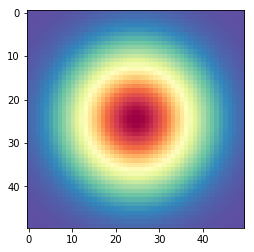

In [20]:
fig_count +=1
outfile = os.path.join(fig_dir, str(fig_count) + '.pdf')
plt.imshow(plot.gkern(50), interpolation='none', cmap='Spectral_r')
plt.savefig(outfile)

## Plot clustered pyfr model

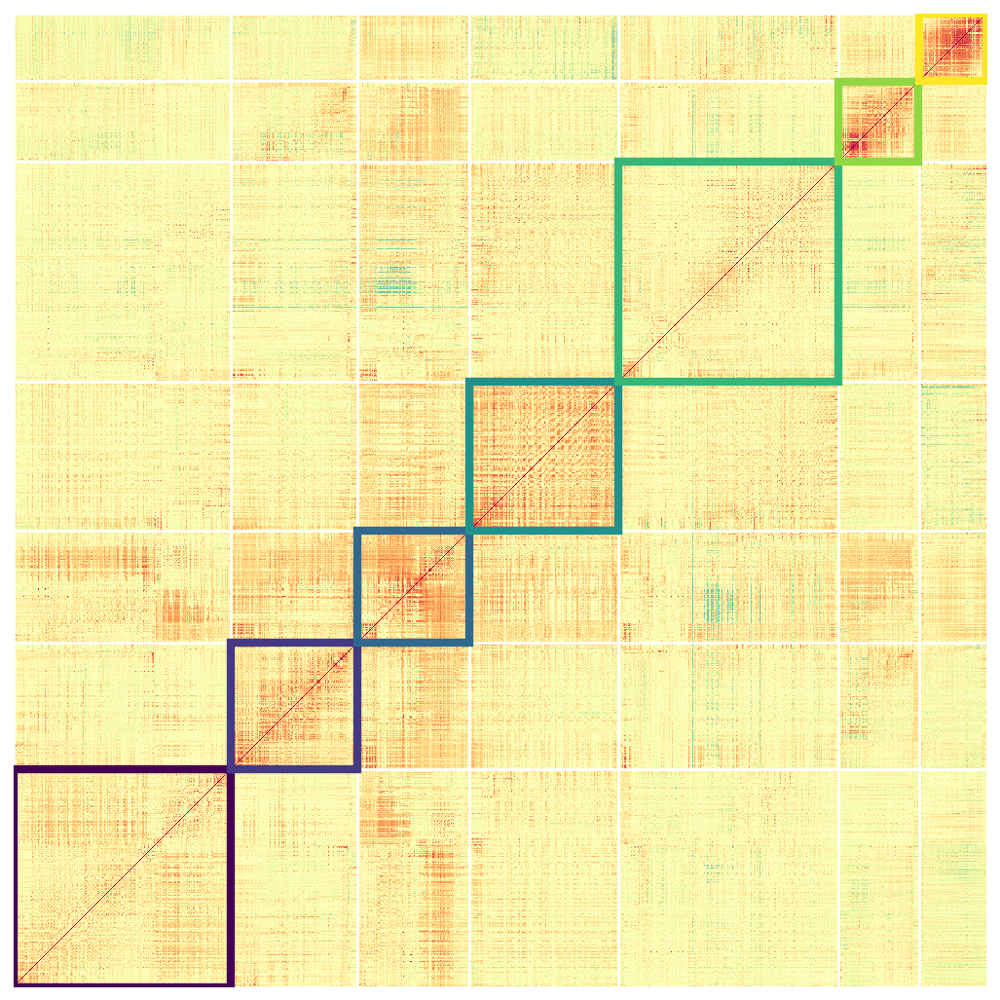

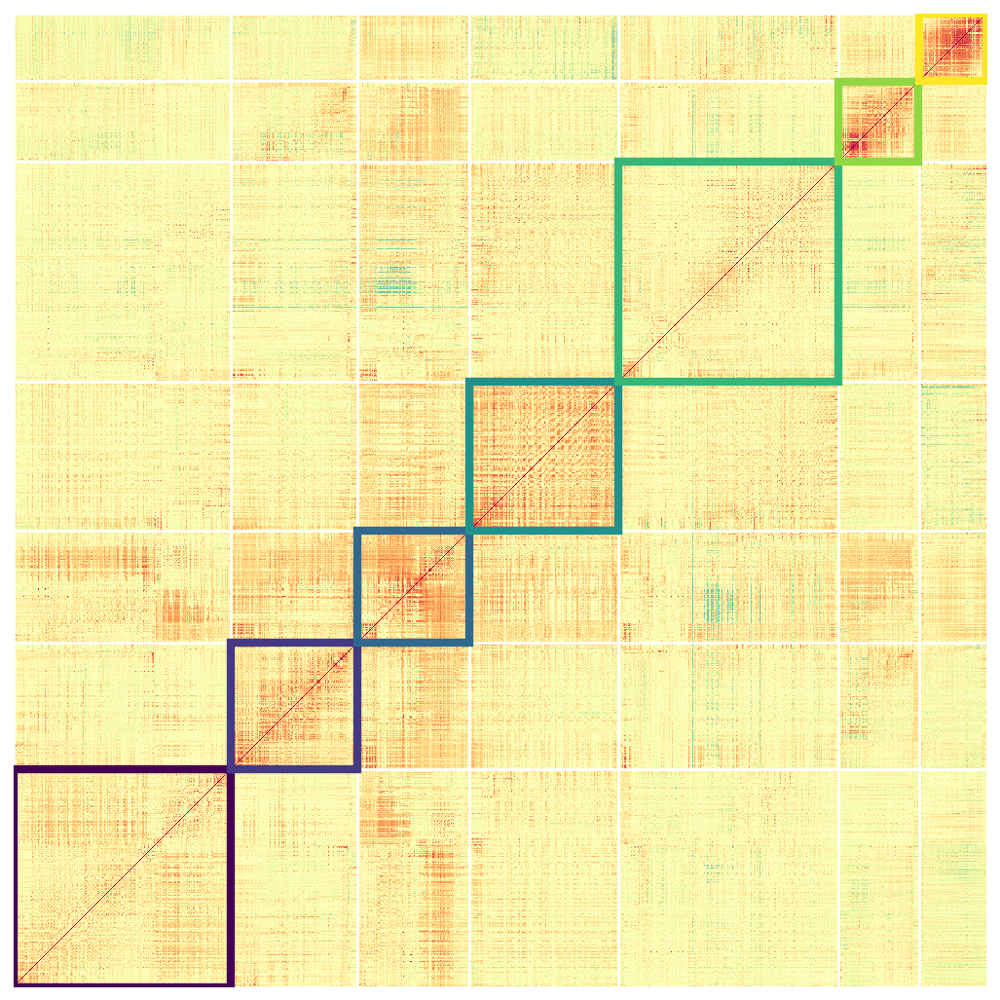

In [21]:
fig_count +=1
outfile = os.path.join(fig_dir, str(fig_count) + '.png')
plot._plot_borderless_clustered(resorted_ave_pyfr_mat, factor_bounds=factor_pyfr_list, factor_colors=c_list, savefile=outfile)


In [22]:
R_pyfr = ave_pyfr_model.get_locs().values
R_pyfr_resorted = R_pyfr[resorted_pyfr_inds]

In [23]:
R_ram = ave_ram_model.get_locs().values

In [24]:
R_ram = ave_ram_model.get_locs().values
R_ram_resorted = R_ram[resorted_ram_inds]

In [25]:
norm = matplotlib.colors.Normalize(vmin=0, vmax=6)

In [26]:
R_bo = se.helpers.get_rows(R_pyfr_resorted, bo.get_locs().values)

In [27]:
c_list = []
for c in np.arange(7):
    c_list.append(list(cm.viridis(norm(c))))

## Plot clustered electrodes 

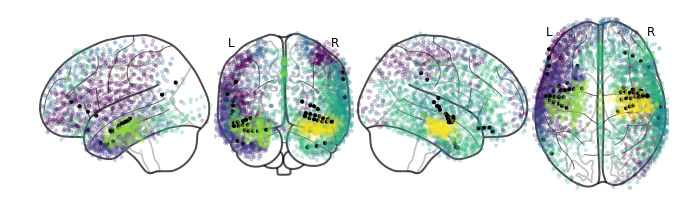

In [28]:
fig_count +=1
outfile = os.path.join(fig_dir, str(fig_count) + '.pdf')

label = []
sub_list = []
for c in np.arange(7):
    for i, v in enumerate(resorted_pyfr_color):
        if v == c:
            color_val = list(cm.viridis(norm(c)))
            color_val[3] = .2
            label.append(color_val)
            
            

colors = np.asarray(label)
R_bo = se.helpers.get_rows(R_pyfr_resorted, bo.get_locs().values)
R_e = se.helpers.get_rows(R_pyfr_resorted, e.values)
colors[R_e[0]] = np.array([1,0,0,1])
colors[R_bo] = np.array([0,0,0,1])
colors = list(map(lambda x: x[0], np.array_split(colors, colors.shape[0], axis=0)))


ni_plt.plot_connectome(np.eye(R_pyfr_resorted.shape[0]), R_pyfr_resorted,
                       node_kwargs={'edgecolors': None}, display_mode='lyrz',
                       node_size=10, node_color=colors)
plt.savefig(outfile)

## Plot clustered models

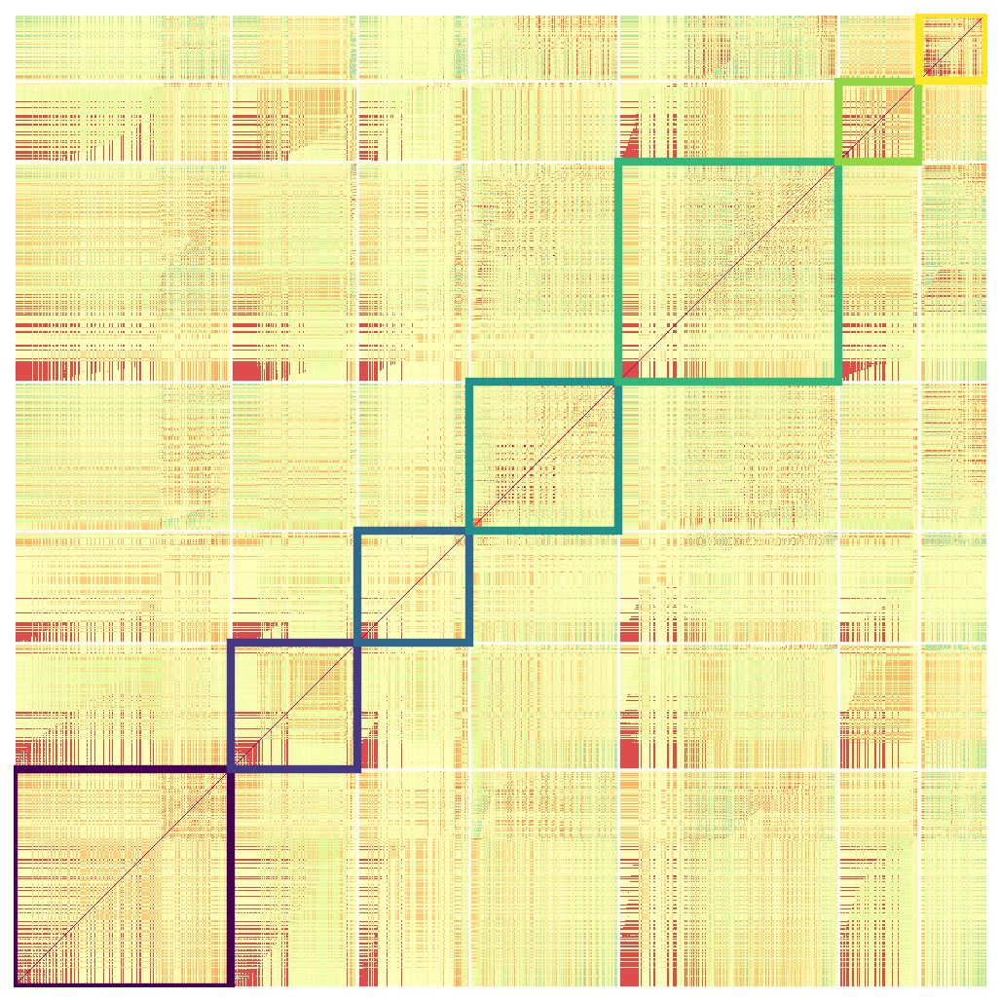

In [29]:
fig_count +=1
outfile = os.path.join(fig_dir, str(fig_count) + '.png')
mat_1 = model_1.get_model(z_transform=False) 
ax = plot._plot_borderless_clustered(mat_1[:, resorted_pyfr_inds][resorted_pyfr_inds, :], factor_bounds=factor_pyfr_list, factor_colors=c_list, savefile=outfile)
plt.show()

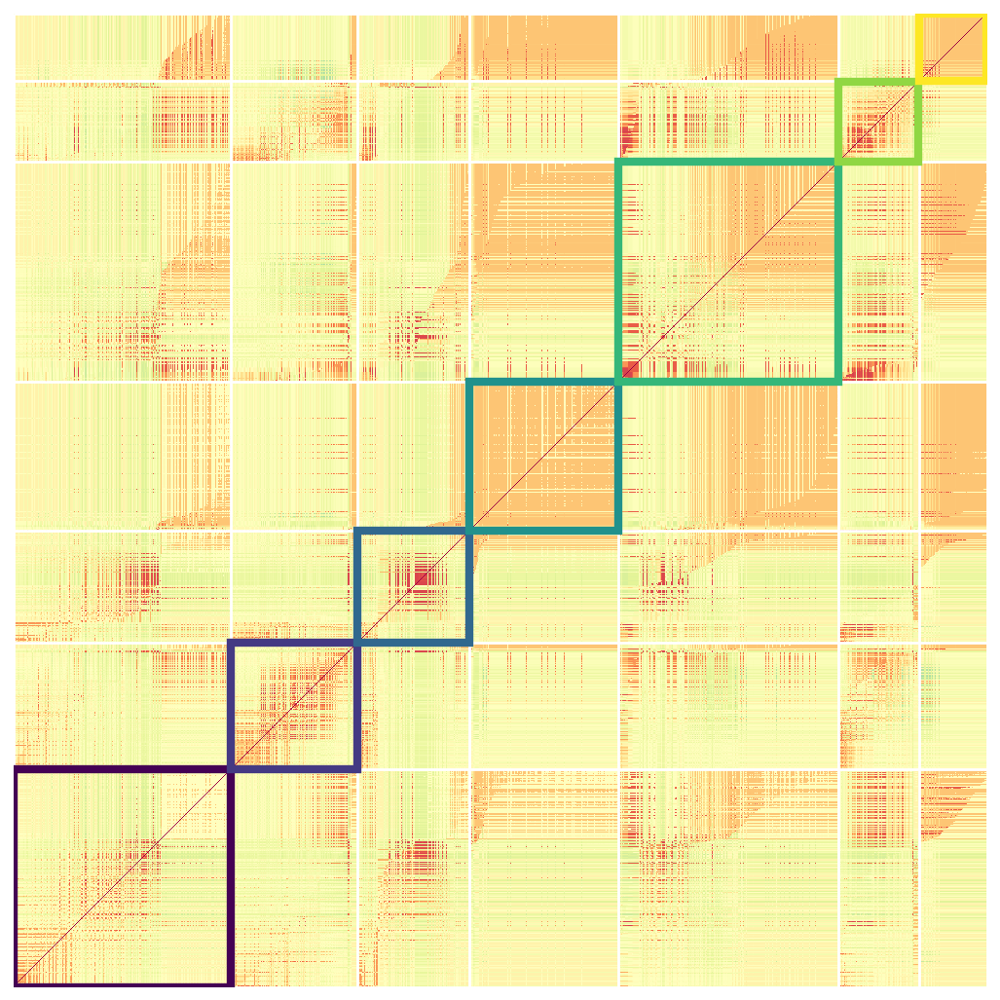

In [30]:
fig_count +=1
outfile = os.path.join(fig_dir, str(fig_count) + '.png')
mat_2 = model_2.get_model(z_transform=False) 
ax = plot._plot_borderless_clustered(mat_2[:, resorted_pyfr_inds][resorted_pyfr_inds, :], factor_bounds=factor_pyfr_list, factor_colors=c_list, savefile=outfile)
plt.show()

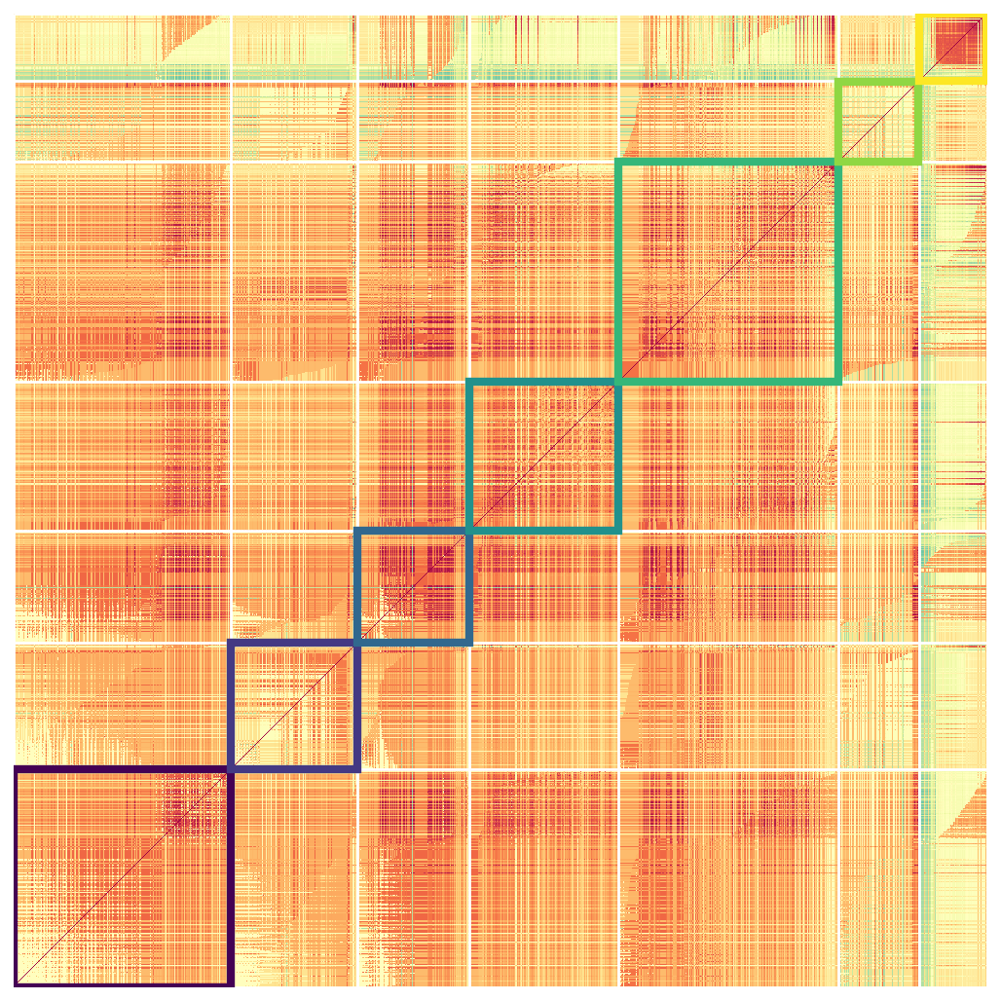

In [31]:
fig_count +=1
outfile = os.path.join(fig_dir, str(fig_count) + '.png')
mat_3 = model_3.get_model(z_transform=False) 
ax = plot._plot_borderless_clustered(mat_3[:, resorted_pyfr_inds][resorted_pyfr_inds, :], factor_bounds=factor_pyfr_list, factor_colors=c_list, savefile=outfile)
plt.show()

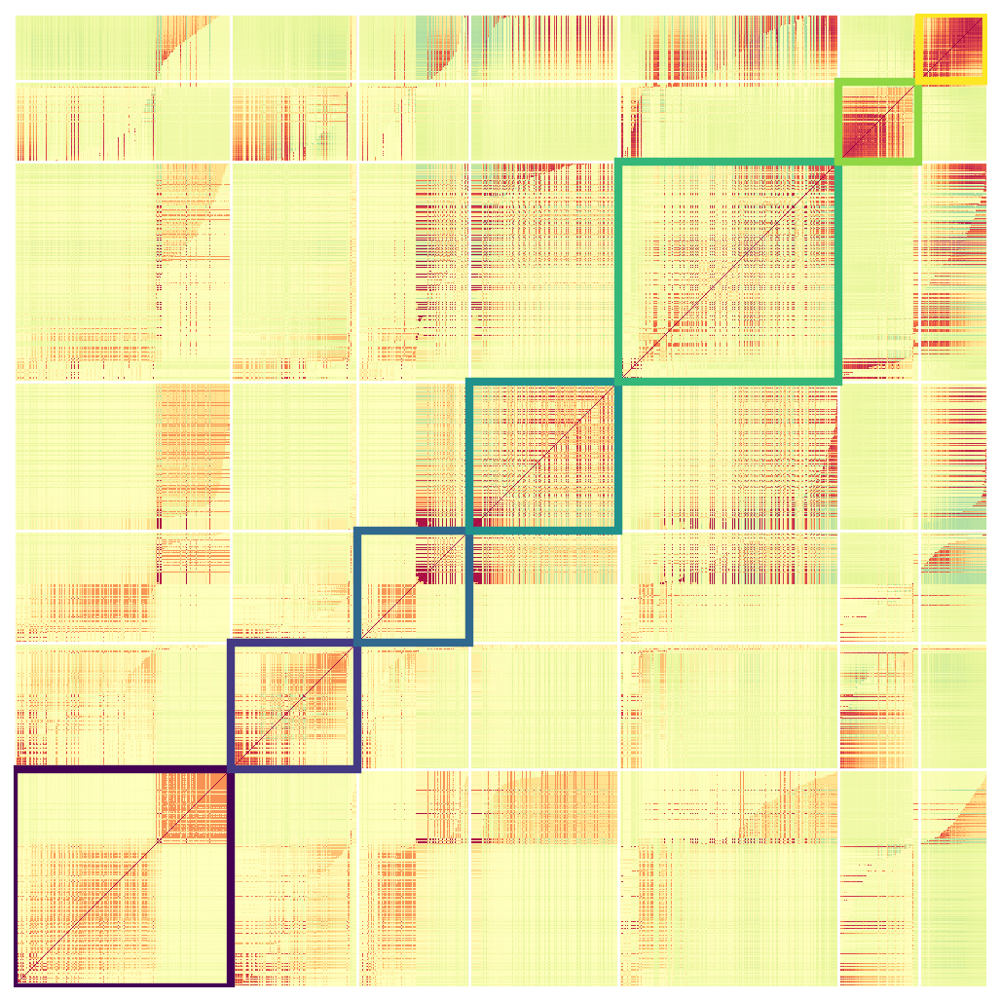

In [32]:
fig_count +=1
outfile = os.path.join(fig_dir, str(fig_count) + '.png')
mat_4 = model_4.get_model(z_transform=False) 
ax = plot._plot_borderless_clustered(mat_4[:, resorted_pyfr_inds][resorted_pyfr_inds, :], factor_bounds=factor_pyfr_list, factor_colors=c_list, savefile=outfile)
plt.show()

## Reconstruct sample brain object timeseries 

In [33]:
mo_s = ave_pyfr_model - mo

R = mo.get_locs().as_matrix()

e = bo.get_locs().iloc[electrode]
R_K_subj = bo.get_locs().as_matrix()
R_K_removed, other_inds = se.helpers.remove_electrode(R_K_subj, R_K_subj, electrode)
known_inds, unknown_inds, e_ind = se.helpers.known_unknown(R, R_K_removed, R_K_subj, electrode)

bo.apply_filter()
actual = bo[:,electrode]
bo = bo[:, other_inds]
bo_r = ave_pyfr_model.predict(bo, recon_loc_inds=e_ind)
c = se.helpers._corr_column(bo_r.data.as_matrix(), actual.get_zscore_data())
print(c)

[0.8966869]


In [34]:
time_data = pd.DataFrame()
time_data['time'] = np.arange(np.shape(actual.get_data())[0])/actual.sample_rate[0]
time_data['actual'] = actual.get_zscore_data()
time_data['predicted'] = bo_r.get_data().values

## Actual vs predicted

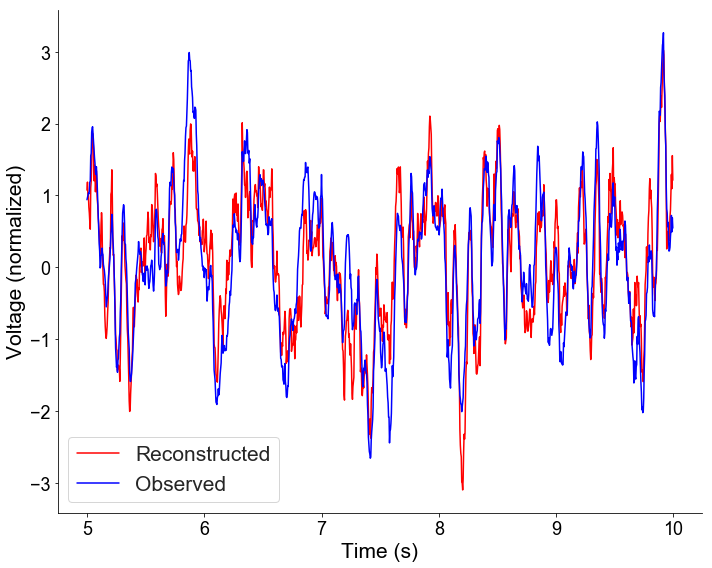

<Figure size 432x288 with 0 Axes>

In [35]:
fig_count +=1
outfile = os.path.join(fig_dir, str(fig_count) + '.pdf')
plot.plot_times_series(time_data, lower_bound=lower_bound, upper_bound=upper_bound, outfile=outfile)
plt.show()
plt.clf()

In [36]:
observed_5s = time_data[(time_data['time'] > lower_bound) & (time_data['time'] < upper_bound)]['actual']
predicted_5s = time_data[(time_data['time'] > lower_bound) & (time_data['time'] < upper_bound)]['predicted']
rstat = stats.pearsonr(observed_5s.as_matrix(), predicted_5s.as_matrix())
print(rstat)

(0.86933994, 0.0)


## Normed electrode activity

<Figure size 1332x756 with 0 Axes>

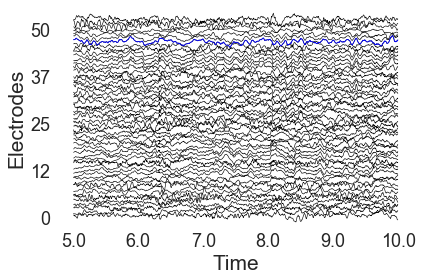

In [37]:
plt.clf()
fig_count +=1
outfile = os.path.join(fig_dir, str(fig_count) + '.pdf')
plot.plot_Y_electrode(time_data= time_data, bo=bo, lower_bound=lower_bound, upper_bound=upper_bound, electrode=electrode, outfile=outfile)


## Actual vs predicted across all timepoints

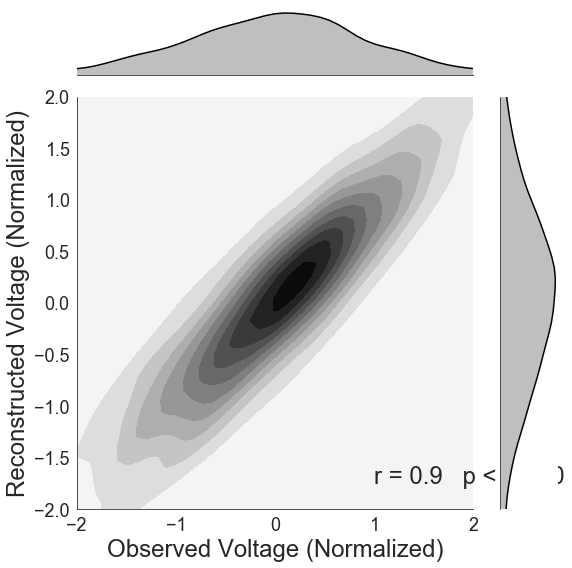

In [38]:
### this actually needs to be computed in full on the cluster

fig_count +=1
outfile = os.path.join(fig_dir, str(fig_count) + '.pdf')
sns.set_style("white")
g = (sns.jointplot(x = actual.get_zscore_data(), y=bo_r.data.as_matrix(), kind="kde", color='k', xlim = (-2,2), ylim = (-2,2), height=8).set_axis_labels('Observed Voltage (Normalized)', 'Reconstructed Voltage (Normalized)', fontsize=24))
ax = g.ax_joint
left, width = .75, .5
bottom, height = .05, .5
rstat = stats.pearsonr(bo_r.get_data().as_matrix(), actual.get_zscore_data())
ax.tick_params(axis='x', labelsize=18)
ax.tick_params(axis='y', labelsize=18)
ax.text(left, bottom, 'r = ' + str(np.round(rstat[0][0],2))+ '   p < '+ str(10**-10),
        horizontalalignment='left',
        verticalalignment='bottom',
        transform=ax.transAxes, fontsize=24)
    
plt.tight_layout()

plt.savefig(outfile)


